In [1]:
import flowkit as fk
import glob
import os
import pandas as pd
from sklearn.preprocessing import StandardScaler
import phenograph
import numpy as np
import matplotlib.pyplot as plt

# SELECT FCS FILE STEP
Step 1: fcs files selection that will be performed in the node in the GUI


The project is: http://flowrepository.org/public_experiment_representations/7120

In [2]:
fcs_files = glob.glob(os.path.join("data/flow_cytometry/spleenocytes/", "*.fcs"))

# for each fcs file create a flowkit Sample object
samples = [fk.Sample(fcs) for fcs in fcs_files]

# generate  total daftaframe
total_df = pd.DataFrame()
for file in fcs_files:
    sample = fk.Sample(file).as_dataframe(source="raw")
    sample["sample_id"] = os.path.basename(file).replace(".fcs", "")
    total_df = pd.concat([total_df, sample], axis=0)
    
# Pre-processing step per mantenere solo il primo livello del MultiIndex con i nomi delle colonne
total_df.columns = total_df.columns.get_level_values(0)

In [3]:
# retain the sample_id index... to be used later for grouping
total_df = total_df.set_index("sample_id")

In [4]:
# Perform a data normalization step with StandardScaler
scaler = StandardScaler()
# subsample the data for faster computation (optional)
if total_df.shape[0] > 50000:
    total_df = total_df.sample(n=50000, random_state=42)
df_scaled = pd.DataFrame(scaler.fit_transform(total_df), columns=total_df.columns, index=total_df.index)


In [5]:
seed = 123
communities_louvain, graph_louvain, Q_louvain = phenograph.cluster(
    df_scaled,
    clustering_algo='louvain',
    seed=seed,
    k=30,  # choose your own k-neighbors (default=30)
    resolution_parameter=0.8  # choose your own res param (default=1.0)
)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 10.269397735595703 seconds
Jaccard graph constructed in 25.035289525985718 seconds
Wrote graph to binary file in 0.8312971591949463 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.877127
After 2 runs, maximum modularity is Q = 0.878339
After 8 runs, maximum modularity is Q = 0.879399
Louvain completed 28 runs in 46.40215015411377 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 82.77822542190552 seconds


In [6]:
communities_leiden, graph_leiden, Q_leiden = phenograph.cluster(
    df_scaled,
    clustering_algo='leiden',
    seed=seed,
    k=30,  # choose your own k-neighbors (default=30)
    resolution_parameter=0.8  # choose your own res param (default=1.0)
)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 10.11324954032898 seconds
Jaccard graph constructed in 16.320006132125854 seconds
Running Leiden optimization
Leiden completed in 43.09035587310791 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 70.14902186393738 seconds


In [7]:
#### Inserisci questo subito dopo la cella che crea `df_scaled` ####
# Trasformazione DataFrame -> AnnData (Scanpy)
import numpy as np
import pandas as pd
import anndata
import scanpy as sc

# 1) Copia di sicurezza
df = df_scaled.copy()

# 2) Rimuovi colonne non numeriche (se presenti)
non_numeric = [c for c in df.columns if not pd.api.types.is_numeric_dtype(df[c])]
if non_numeric:
    print(f"Rimuovendo colonne non numeriche: {non_numeric}")
    df = df.drop(columns=non_numeric)

# 3) Gestione NaN: riempi con 0 o con la media (scegli ciò che preferisci)
if df.isna().any().any():
    print("Trovati NaN: riempio con la media delle colonne")
    df = df.fillna(df.mean())

# 4) Costruzione index univoco per AnnData (AnnData.obs index dovrebbe essere unico)
#    Manteniamo sample_id come colonna in .obs (l'indice originale può ripetersi)
orig_index = df.index.astype(str)  # sample_id
unique_obs_index = [f"{sid}_{i}" for i, sid in enumerate(orig_index)]
obs = pd.DataFrame({"sample_id": orig_index}, index=unique_obs_index)

# 5) var (features)
var = pd.DataFrame(index=df.columns.astype(str))

# 6) AnnData (X come np.array float32)
adata = anndata.AnnData(X=df.values.astype(np.float32), obs=obs, var=var)

# 7) un paio di comodità
adata.obs["original_index"] = orig_index  # se vuoi preservare
print(f"AnnData creato: {adata.shape[0]} cells x {adata.shape[1]} features")

AnnData creato: 50000 cells x 19 features


/home/fdotta/dev/omnis/pipeline_microservice/metabolomics_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.10.4 anndata==0.10.8 umap==0.5.7 numpy==1.26.4 scipy==1.12.0 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13
computing PCA
    with n_comps=18
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:32)
running Leiden clustering


/tmp/ipykernel_3596185/2296050439.py:20: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.8, key_added="leiden")


    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:33)
AnnData salvato in adata_from_df_scaled.h5ad


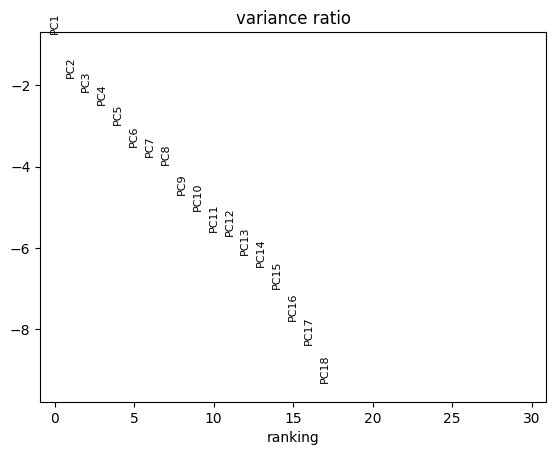

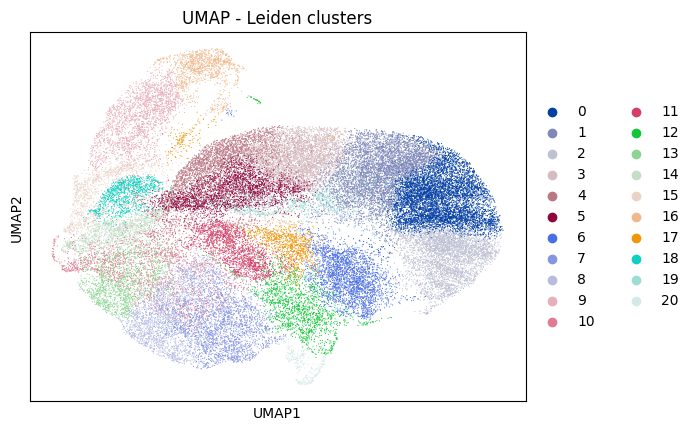

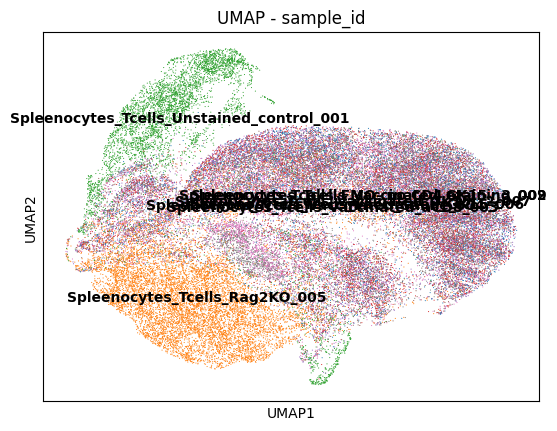

In [8]:
#### Pipeline Scanpy: PCA -> neighbors -> UMAP -> Leiden clustering ####
import scanpy as sc

# impostazioni di plotting (opzionali)
sc.settings.verbosity = 3
sc.logging.print_header()

# 1) PCA (consigliabile se molte feature)
sc.pp.scale(adata, max_value=10)   # già scaled ma utile per numeri outliers
sc.tl.pca(adata, svd_solver='arpack', n_comps=len(adata.var_names)-1)  # tutte le PCs
sc.pl.pca_variance_ratio(adata, log=True, show=False)  # visuale var explained

# 2) Grafo dei vicini
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=len(adata.var_names)-1)  # usa tutte le PCs

# 3) UMAP embedding
sc.tl.umap(adata, min_dist=0.5, spread=1.0)

# 4) Clustering (Leiden)
sc.tl.leiden(adata, resolution=0.8, key_added="leiden")

# 5) Plot UMAP colorato per cluster e per sample_id
sc.pl.umap(adata, color=["leiden"], title="UMAP - Leiden clusters", show=False)
sc.pl.umap(adata, color=["sample_id"], title="UMAP - sample_id", legend_loc='on data', show=False)

# 6) Salva il risultato
adata.write("adata_from_df_scaled.h5ad")
print("AnnData salvato in adata_from_df_scaled.h5ad")

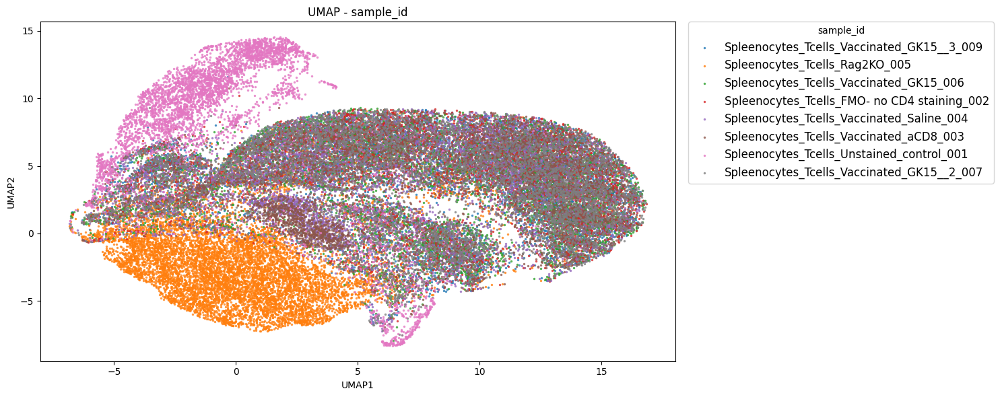

In [9]:
# UMAP per sample_id con legenda esplicita
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# assicuriamoci che X_umap esista
if 'X_umap' not in adata.obsm:
    raise RuntimeError("Eseguire prima `sc.tl.umap(adata)` per popolari adata.obsm['X_umap'].")

# estrai coords e labels
umap_coords = adata.obsm['X_umap']
df_umap = pd.DataFrame(umap_coords, columns=['UMAP1', 'UMAP2'], index=adata.obs_names)
df_umap['sample_id'] = adata.obs['sample_id'].astype(str).values

# definisci palette (leggibile) e mappa colori ai sample
samples = list(pd.unique(df_umap['sample_id']))
n_samples = len(samples)
if n_samples <= 10:
    palette = sns.color_palette("tab10", n_samples)
elif n_samples <= 20:
    palette = sns.color_palette("tab20", n_samples)
else:
    # per molti sample usa una palette distribuita
    palette = sns.husl_palette(n_samples, l=.6, s=.8)

color_map = dict(zip(samples, palette))

# plotting
fig, ax = plt.subplots(figsize=(15, 6))
for s in samples:
    sel = df_umap['sample_id'] == s
    ax.scatter(
        df_umap.loc[sel, 'UMAP1'],
        df_umap.loc[sel, 'UMAP2'],
        s=6,
        c=[color_map[s]],
        label=s,
        linewidths=0,
        alpha=0.8
    )

ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('UMAP - sample_id')

# posizione legenda: se pochi sample la mettiamo a destra, se molti creiamo una legenda compatta a lato
if n_samples <= 25:
    # legenda di dimensione normale a destra
    ax.legend(title='sample_id', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=12)
else:
    # molti sample: legenda più compatta (font piccolo, colonne)
    ax.legend(title='sample_id', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.,
              fontsize='xx-small', ncol=2)

plt.tight_layout()
plt.show()


AnnData creato: 50000 cells x 19 features
scanpy==1.10.4 anndata==0.10.8 umap==0.5.7 numpy==1.26.4 scipy==1.12.0 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13
computing PCA
    with n_comps=18


    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:31)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:37)
AnnData salvato in adata_from_df_scaled.h5ad


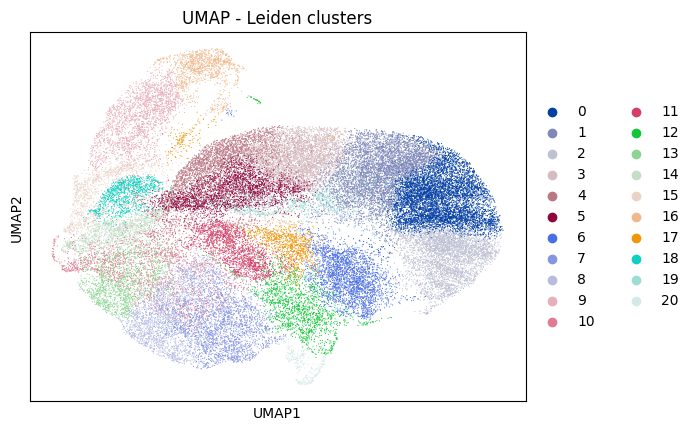

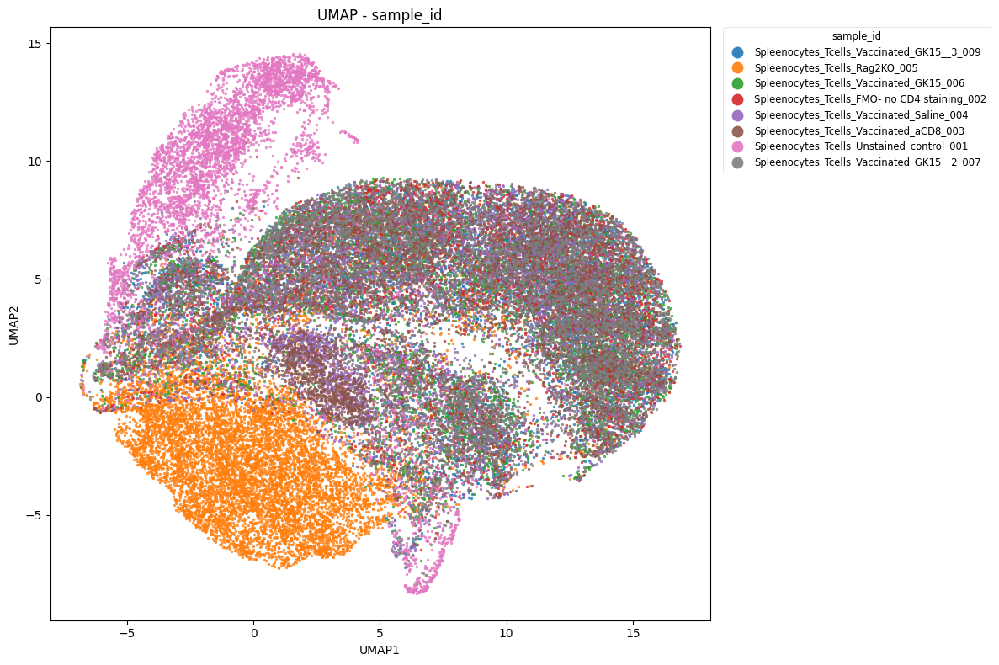

In [33]:
# UMAP pipeline completa: da FCS -> df_scaled -> AnnData -> PCA/UMAP/Leiden -> plot con legenda ingrandita
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import flowkit as fk
from sklearn.preprocessing import StandardScaler
import phenograph           # opzionale, lo usavi in precedenza
import anndata
import scanpy as sc
from matplotlib.lines import Line2D

# ---- 1) Caricamento FCS e costruzione DataFrame ----
fcs_files = glob.glob(os.path.join("data/flow_cytometry/spleenocytes/", "*.fcs"))
if len(fcs_files) == 0:
    raise FileNotFoundError("Nessun file .fcs trovato in data/flow_cytometry/spleenocytes/")

# (opzionale) crea oggetti flowkit Sample (non strettamente necessario per la conversione finale)
samples = [fk.Sample(fcs) for fcs in fcs_files]

# costruisci il DataFrame aggregato
total_df = pd.DataFrame()
for file in fcs_files:
    sample_df = fk.Sample(file).as_dataframe(source="raw")
    sample_df["sample_id"] = os.path.basename(file).replace(".fcs", "")
    total_df = pd.concat([total_df, sample_df], axis=0)

# se le colonne sono MultiIndex, manteniamo solo il primo livello (come nel tuo notebook)
if isinstance(total_df.columns, pd.MultiIndex):
    total_df.columns = total_df.columns.get_level_values(0)

# metti sample_id come indice (come fai nel notebook)
total_df = total_df.set_index("sample_id")

# ---- 2) Normalizzazione / subsample ----
scaler = StandardScaler()
# subsample per velocità se troppo grande
if total_df.shape[0] > 50000:
    total_df = total_df.sample(n=50000, random_state=42)

df_scaled = pd.DataFrame(scaler.fit_transform(total_df),
                         columns=total_df.columns,
                         index=total_df.index)

# ---- 3) (opzionale) clustering con Phenograph come avevi prima ----
seed = 123
# communities_louvain, graph_louvain, Q_louvain = phenograph.cluster(
#     df_scaled,
#     clustering_algo='louvain',
#     seed=seed,
#     k=30,
#     resolution_parameter=0.8
# )

# ---- 4) Trasformazione in AnnData ----
df = df_scaled.copy()

# rimuovi colonne non numeriche (se ci sono)
non_numeric = [c for c in df.columns if not pd.api.types.is_numeric_dtype(df[c])]
if non_numeric:
    print(f"Rimuovendo colonne non numeriche: {non_numeric}")
    df = df.drop(columns=non_numeric)

# riempi NaN con la media della colonna
if df.isna().any().any():
    print("Trovati NaN: riempio con la media delle colonne")
    df = df.fillna(df.mean())

# costruisci indice unico per adata.obs (annata richiede indici unici)
orig_index = df.index.astype(str)  # sample_id ripetuto per righe
unique_obs_index = [f"{sid}_{i}" for i, sid in enumerate(orig_index)]
obs = pd.DataFrame({"sample_id": orig_index}, index=unique_obs_index)

# var (feature names)
var = pd.DataFrame(index=df.columns.astype(str))

# crea AnnData
adata = anndata.AnnData(X=df.values.astype(np.float32), obs=obs, var=var)
adata.obs["original_index"] = orig_index  # utile per riferimento

print(f"AnnData creato: {adata.n_obs} cells x {adata.n_vars} features")

# ---- 5) Pipeline Scanpy (PCA -> neighbors -> UMAP -> Leiden) ----
sc.settings.verbosity = 3
sc.logging.print_header()

# scala (opzionale, già standardizzato ma aiuta a limitare outlier)
sc.pp.scale(adata, max_value=10)

# scegli numero di PC ragionevole
n_pcs = min(30, max(2, adata.n_vars - 1))
sc.tl.pca(adata, svd_solver='arpack', n_comps=n_pcs)
sc.pl.pca_variance_ratio(adata, log=True, show=False, save="umap.png")

# grafo dei vicini
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=n_pcs)

# UMAP
sc.tl.umap(adata, min_dist=0.5, spread=1.0)

# Leiden clustering
sc.tl.leiden(adata, resolution=0.8, key_added="leiden")

# salva adata
adata.write("adata_from_df_scaled.h5ad")
print("AnnData salvato in adata_from_df_scaled.h5ad")

# ---- 6) Plot UMAP - clusters (default Scanpy) ----
sc.pl.umap(adata, color=["leiden"], title="UMAP - Leiden clusters", show=True, save="leiden_clusters.png")

# ---- 7) Plot UMAP - sample_id con legenda esplicita e marker legenda ingranditi ----
# assicurati che UMAP sia calcolato
if "X_umap" not in adata.obsm:
    raise RuntimeError("Eseguire prima `sc.tl.umap(adata)` per popolari adata.obsm['X_umap'].")

# estrai coords e labels
umap_coords = adata.obsm["X_umap"]
df_umap = pd.DataFrame(umap_coords, columns=["UMAP1", "UMAP2"], index=adata.obs_names)
df_umap["sample_id"] = adata.obs["sample_id"].astype(str).values

# palette e mappa colore
samples = list(pd.unique(df_umap["sample_id"]))
n_samples = len(samples)
if n_samples <= 10:
    palette = sns.color_palette("tab10", n_samples)
elif n_samples <= 20:
    palette = sns.color_palette("tab20", n_samples)
else:
    palette = sns.husl_palette(n_samples, l=.6, s=.8)

color_map = dict(zip(samples, palette))

# plotting punti
fig, ax = plt.subplots(figsize=(12, 8))
for s in samples:
    sel = df_umap["sample_id"] == s
    ax.scatter(
        df_umap.loc[sel, "UMAP1"],
        df_umap.loc[sel, "UMAP2"],
        s=6,
        c=[color_map[s]],
        label=s,
        linewidths=0,
        alpha=0.8
    )

ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
ax.set_title("UMAP - sample_id")

# costruisci proxy handles con marker più grandi per la legenda
handles = []
labels = samples

# scegli marker size della legenda in base al numero di sample
if n_samples <= 25:
    legend_markersize = 10
    legend_fontsize = "small"
    ncol = 1
elif n_samples <= 50:
    legend_markersize = 8
    legend_fontsize = "x-small"
    ncol = 2
else:
    legend_markersize = 6
    legend_fontsize = "xx-small"
    ncol = min(4, max(2, int(n_samples / 25)))

for s in samples:
    handles.append(
        Line2D([0], [0],
               marker='o',
               color='w',
               markerfacecolor=color_map[s],
               markersize=legend_markersize,
               markeredgewidth=0,
               alpha=0.9)
    )

# imposta legenda con i proxy
leg = ax.legend(handles, labels, title="sample_id",
                bbox_to_anchor=(1.02, 1), loc="upper left",
                borderaxespad=0., fontsize=legend_fontsize,
                title_fontsize=legend_fontsize, ncol=ncol)

# estetica: bordino e layout
leg.get_frame().set_edgecolor("lightgray")
leg.get_frame().set_linewidth(0.5)
plt.tight_layout()
plt.savefig('umap_sample_id_legend.png', dpi=300)
plt.show()

Trovati 14 marker che terminano con '-A'
Plotting batch 1/2: ['leiden', 'FSC-A', 'SSC-A', 'BV421-A', 'BV510-A', 'BV605-A', 'BV650-A', 'BV786-A', 'BB515-A']


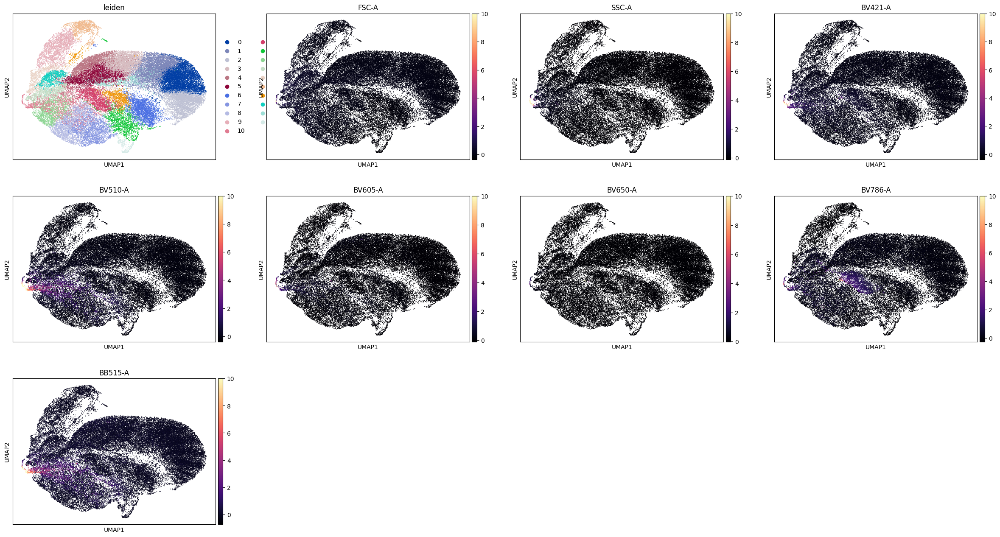

Plotting batch 2/2: ['leiden', 'PE-A', 'PE-CF594-A', 'PerCP-Cy5-5-A', 'APC-A', 'APC-R700-A', 'APC-Cy7-A']


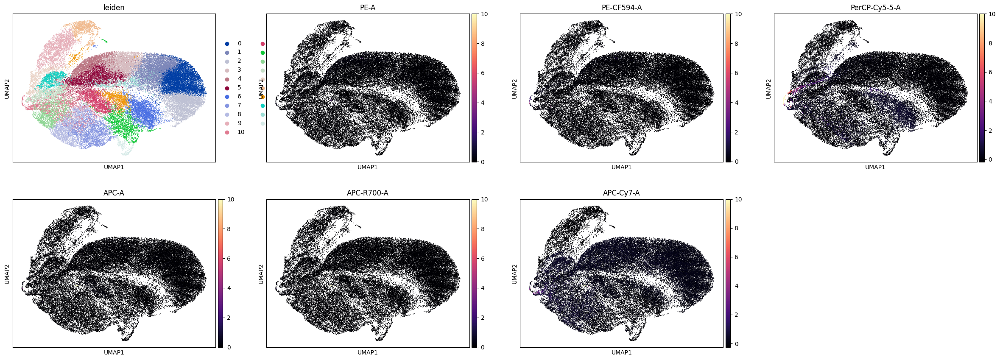

In [29]:
# ---- Plot espressione marker su UMAP (tutti i markers che terminano con "-A") ----
# cerca marker che terminano con "-A"
markers = [m for m in adata.var_names if str(m).endswith("-A")]
print(f"Trovati {len(markers)} marker che terminano con '-A'")

if len(markers) == 0:
    print("Nessun marker terminante con '-A' trovato in adata.var_names. Controlla i nomi delle feature.")
else:
    # base list include il cluster 'leiden' (se presente)
    base_list = ["leiden"] if "leiden" in adata.obs.columns else []

    # scanpy può disegnare più pannelli se passi una lista; facciamo in batch per non sovraccaricare la figura
    batch_size = 8            # quanti pannelli per figura (modifica se vuoi più/meno)
    n_batches = (len(markers) + batch_size - 1) // batch_size

    for i in range(n_batches):
        batch = markers[i * batch_size:(i + 1) * batch_size]
        cols = base_list + batch
        print(f"Plotting batch {i+1}/{n_batches}: {cols}")

        # usa sc.pl.umap: ncols regola la griglia, size = punto marker (6 è coerente con la visualizzazione precedente)
        # nota: scanpy calcola la scala di colore globalmente per ciascun pannello automaticamente
        sc.pl.umap(adata, color=cols, ncols=4, size=6, cmap="magma", show=True)

        # Se vuoi salvare ogni figura automaticamente, scommenta le righe seguenti:
        # outname = f"umap_markers_batch_{i+1}.png"
        # plt.gcf().savefig(outname, dpi=150, bbox_inches="tight")
        # plt.close()

Trovati 14 marker che terminano con '-A'
Saved umap_marker_batch_1.png


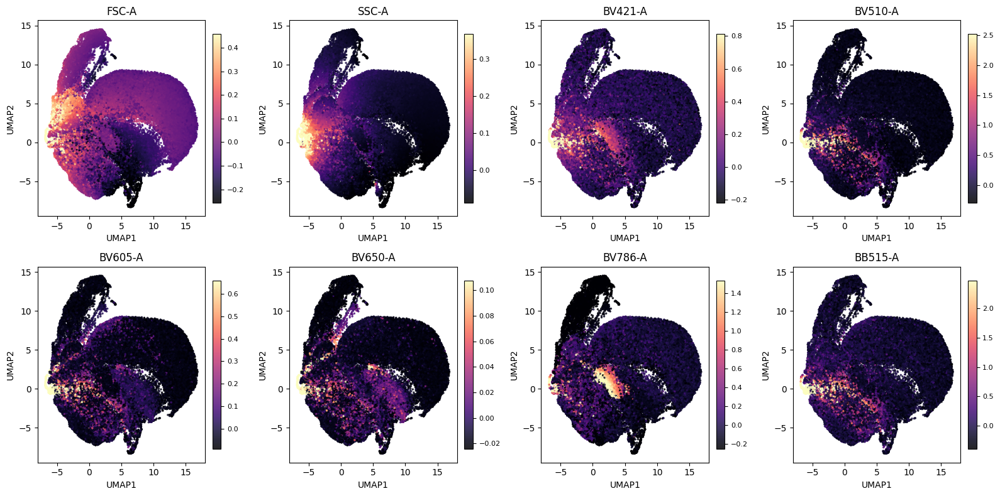

Saved umap_marker_batch_2.png


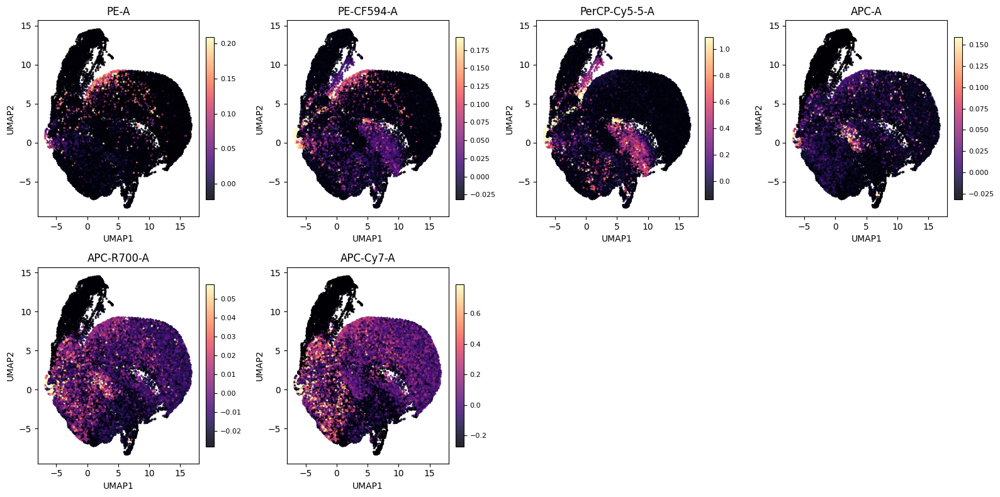

In [35]:
# Plot per ogni marcatore (vmin/vmax percentilico) - incolla dopo la cella che ha calcolato UMAP
import numpy as np
import math
import matplotlib as mpl
import matplotlib.pyplot as plt

# parametri modificabili
marker_suffix = "-A"      # seleziona i marker che terminano con questo suffisso
pct_clip = (1, 99)       # percentili per clipping vmin/vmax
batch_size = 8           # quanti marker per figura (escludendo 'leiden' se la vuoi mostrare)
ncols = 4
size = 6
cmap = "magma"
use_raw = False          # se True e adata.raw esiste, usa i valori raw
max_points_plot = 50000  # se molte celle, verrà subsampling
save_plots = True       # True per salvare ogni figura
out_prefix = "umap_marker"

# trova i marker
markers = [m for m in adata.var_names if str(m).endswith(marker_suffix)]
print(f"Trovati {len(markers)} marker che terminano con '{marker_suffix}'")

if len(markers) == 0:
    print("Nessun marker trovato. Controlla i nomi delle feature.")
else:
    # coords e (opzionale) subsampling
    if "X_umap" not in adata.obsm:
        raise RuntimeError("Eseguire prima `sc.tl.umap(adata)` per popolari adata.obsm['X_umap'].")
    umap_coords = np.asarray(adata.obsm["X_umap"])
    n_cells = umap_coords.shape[0]
    if n_cells > max_points_plot:
        rng = np.random.default_rng(42)
        keep_idx = np.sort(rng.choice(n_cells, size=max_points_plot, replace=False))
        umap_coords_plot = umap_coords[keep_idx]
        print(f"Dataset grande ({n_cells} cells): subsampling a {max_points_plot} punti per plot.")
    else:
        keep_idx = None
        umap_coords_plot = umap_coords

    def _get_vals(marker):
        # prefer raw se richiesto e disponibile
        if use_raw and getattr(adata, "raw", None) is not None and marker in adata.raw.var_names:
            mat = adata.raw[:, marker].X
        else:
            mat = adata[:, marker].X
        # supporto sparse / dense
        try:
            vals = np.asarray(mat).ravel()
        except Exception:
            vals = mat.toarray().ravel()
        if keep_idx is not None:
            vals = vals[keep_idx]
        return vals

    n_batches = math.ceil(len(markers) / batch_size)
    for bi in range(n_batches):
        batch = markers[bi * batch_size:(bi + 1) * batch_size]
        cols = batch
        n_panels = len(cols)
        nrows = math.ceil(n_panels / ncols)
        figsize = (ncols * 4, nrows * 4)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
        axes = np.array(axes).ravel() if isinstance(axes, np.ndarray) else [axes]

        for ax_idx, marker in enumerate(cols):
            ax = axes[ax_idx]
            vals = _get_vals(marker)

            # clipping percentilico per evitare saturazione da outlier
            vmin = np.percentile(vals, pct_clip[0])
            vmax = np.percentile(vals, pct_clip[1])
            if vmax <= vmin:
                vmin = float(np.min(vals))
                vmax = float(np.max(vals))
                if vmax == vmin:
                    vmax = vmin + 1e-6

            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

            sc = ax.scatter(umap_coords_plot[:, 0], umap_coords_plot[:, 1],
                            c=vals, cmap=cmap, s=size, norm=norm,
                            linewidths=0, alpha=0.85, rasterized=True)
            ax.set_title(str(marker))
            ax.set_xlabel("UMAP1")
            ax.set_ylabel("UMAP2")
            cb = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
            cb.ax.tick_params(labelsize=8)

        # nascondi assi inutilizzati
        for j in range(n_panels, len(axes)):
            axes[j].axis("off")

        plt.tight_layout()
        if save_plots:
            outname = f"{out_prefix}_batch_{bi+1}.png"
            plt.savefig(outname, dpi=150, bbox_inches="tight")
            print(f"Saved {outname}")
        plt.show()